In [1]:
!nvidia-smi

Wed Feb 12 05:25:27 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   60C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Install YOLO11 via Ultralytics

In [2]:
%pip install "ultralytics<=8.3.40" supervision roboflow
import ultralytics
ultralytics.checks()

Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.2/112.6 GB disk)


In [3]:
!pip install roboflow

In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="O5hDeMQaybBKf51Z2CIT")
project = rf.workspace("adpm").project("finger-tips-detection")
version = project.version(1)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Finger-TIps-detection-1 in yolov11:: 100%|██████████| 1814/1814 [00:00<00:00, 8274.24it/s]


In [6]:
!pip install ultralytics

In [7]:

from ultralytics import YOLO
model = YOLO('yolo11s-seg.pt')

train_results = model.train(
    data='/content/Finger-TIps-detection-1/data.yaml',
    epochs=30,
    imgsz=640,
    device=0,
    )


100%|██████████| 19.7M/19.7M [00:00<00:00, 130MB/s] 


New https://pypi.org/project/ultralytics/8.3.74 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11s-seg.pt, data=/content/Finger-TIps-detection-1/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=F

100%|██████████| 755k/755k [00:00<00:00, 20.0MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 109MB/s]


AMP: checks passed ✅


train: Scanning /content/Finger-TIps-detection-1/train/labels... 789 images, 0 backgrounds, 0 corrupt: 100%|██████████| 789/789 [00:00<00:00, 1765.40it/s]

train: New cache created: /content/Finger-TIps-detection-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: '2.0.4' (you have '2.0.3'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
Argument(s) 'quality_lower' are not valid for transform ImageCompression
val: Scanning /content/Finger-TIps-detection-1/valid/labels... 74 images, 0 backgrounds, 0 corrupt: 100%|██████████| 74/74 [00:00<00:00, 1241.36it/s]

val: New cache created: /content/Finger-TIps-detection-1/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30      5.39G     0.9091      1.367      2.163      1.169         21        640: 100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.85it/s]

                   all         74        182      0.644       0.75      0.749       0.62      0.644       0.75      0.749      0.639



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30       5.4G     0.7942     0.9253      0.987      1.056         16        640: 100%|██████████| 50/50 [00:21<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.31it/s]

                   all         74        182       0.81      0.836      0.925      0.731      0.808       0.83      0.915      0.729



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30      5.34G     0.8001     0.9221     0.8568      1.052         10        640: 100%|██████████| 50/50 [00:21<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]


                   all         74        182       0.72      0.816      0.869      0.675       0.72      0.812      0.868      0.691

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30       5.3G     0.8048     0.8989     0.7768      1.067         16        640: 100%|██████████| 50/50 [00:22<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]


                   all         74        182      0.827      0.924       0.95      0.794      0.827      0.924       0.95      0.818

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      5.31G     0.7707     0.8717     0.6965      1.028         17        640: 100%|██████████| 50/50 [00:22<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.78it/s]

                   all         74        182      0.847      0.899      0.949       0.79      0.847      0.899      0.949      0.798



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30       5.3G     0.7479     0.8411     0.6633      1.036         15        640: 100%|██████████| 50/50 [00:24<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all         74        182      0.934      0.966      0.991      0.833      0.934      0.966      0.991      0.858



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      5.34G     0.7447     0.8062     0.6347      1.034         14        640: 100%|██████████| 50/50 [00:21<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]


                   all         74        182      0.981      0.986      0.991      0.837      0.981      0.986      0.991      0.855

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      5.32G      0.736     0.8227     0.5981      1.038         15        640: 100%|██████████| 50/50 [00:22<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all         74        182      0.991      0.991      0.992      0.852      0.991      0.991      0.992      0.872



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      5.31G     0.7162     0.7681     0.5664      1.013         22        640: 100%|██████████| 50/50 [00:21<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all         74        182      0.974      0.986      0.992       0.85      0.974      0.986      0.992      0.872



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      5.35G     0.6892     0.7689     0.5554       1.01         21        640: 100%|██████████| 50/50 [00:21<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all         74        182      0.947      0.962      0.973      0.848      0.947      0.962      0.973      0.853



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30       5.4G     0.6851     0.7836     0.5364       1.01         30        640: 100%|██████████| 50/50 [00:21<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         74        182      0.973      0.994      0.992      0.864      0.973      0.994      0.992      0.872



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30      5.24G     0.6747     0.7623     0.5111     0.9965         25        640: 100%|██████████| 50/50 [00:21<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.86it/s]

                   all         74        182      0.994      0.995      0.994      0.852      0.994      0.995      0.994      0.879



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      5.32G     0.6815     0.7607     0.5096      0.995         18        640: 100%|██████████| 50/50 [00:22<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all         74        182      0.992      0.995      0.995      0.863      0.992      0.995      0.995      0.872



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      5.31G      0.648     0.7339     0.4875     0.9956         20        640: 100%|██████████| 50/50 [00:21<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.80it/s]

                   all         74        182      0.987      0.995      0.993      0.868      0.987      0.995      0.993      0.872



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30      5.33G     0.6668     0.7608     0.4837      1.008         25        640: 100%|██████████| 50/50 [00:21<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         74        182      0.983       0.99      0.993      0.872      0.983       0.99      0.993       0.88



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      5.35G     0.6364     0.7159     0.4512     0.9846         21        640: 100%|██████████| 50/50 [00:21<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         74        182      0.992      0.993      0.991      0.873      0.992      0.993      0.991      0.874



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      5.38G     0.6405     0.7362     0.4447     0.9934         21        640: 100%|██████████| 50/50 [00:20<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all         74        182       0.99      0.991      0.992      0.875       0.99      0.991      0.992      0.882



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      5.33G      0.611     0.7209     0.4566     0.9732         16        640: 100%|██████████| 50/50 [00:20<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all         74        182      0.988      0.995       0.99      0.872      0.988      0.995       0.99      0.878



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      5.31G     0.6312     0.6909     0.4396     0.9802         30        640: 100%|██████████| 50/50 [00:21<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]


                   all         74        182      0.995      0.995      0.992      0.881      0.995      0.995      0.992       0.88

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      5.32G     0.6235     0.7113     0.4204     0.9784         22        640: 100%|██████████| 50/50 [00:21<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         74        182      0.991      0.995      0.992      0.878      0.991      0.995      0.992      0.881


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      5.25G     0.5211     0.6117     0.3041     0.9151         11        640: 100%|██████████| 50/50 [00:23<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.81it/s]

                   all         74        182      0.991      0.995      0.992      0.863      0.991      0.995      0.992      0.866



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30      5.23G     0.5276     0.6058     0.3062     0.9198         11        640: 100%|██████████| 50/50 [00:20<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.90it/s]

                   all         74        182      0.994      0.991      0.995      0.862      0.994      0.991      0.995      0.874



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30      5.25G      0.523     0.5911     0.2983      0.909         11        640: 100%|██████████| 50/50 [00:20<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all         74        182      0.993      0.995      0.993      0.882      0.993      0.995      0.993       0.89



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30      5.23G     0.5043     0.5776     0.2866     0.9052          8        640: 100%|██████████| 50/50 [00:20<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all         74        182      0.993      0.995      0.993      0.888      0.993      0.995      0.993      0.889



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      5.24G     0.4829     0.5638     0.2785     0.8943          8        640: 100%|██████████| 50/50 [00:20<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         74        182      0.992      0.995      0.993      0.876      0.992      0.995      0.993      0.886



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30       5.2G     0.4823     0.5566     0.2717     0.8877         17        640: 100%|██████████| 50/50 [00:20<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.83it/s]

                   all         74        182      0.995      0.995      0.993      0.881      0.995      0.995      0.993      0.878



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      5.23G     0.4737     0.5571     0.2596     0.8909          8        640: 100%|██████████| 50/50 [00:20<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.89it/s]

                   all         74        182      0.994      0.993      0.993      0.882      0.994      0.993      0.993      0.882



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      5.23G      0.456     0.5487     0.2554     0.8806         11        640: 100%|██████████| 50/50 [00:20<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.98it/s]

                   all         74        182      0.993      0.995      0.993       0.89      0.993      0.995      0.993      0.884



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      5.25G     0.4442     0.5422     0.2481     0.8772         17        640: 100%|██████████| 50/50 [00:20<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.79it/s]

                   all         74        182      0.994      0.995      0.993      0.876      0.994      0.995      0.993       0.88



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30      5.23G     0.4315     0.5351     0.2413     0.8718         11        640: 100%|██████████| 50/50 [00:20<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.81it/s]

                   all         74        182      0.995      0.995      0.993       0.89      0.995      0.995      0.993       0.88



30 epochs completed in 0.202 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 20.5MB
Optimizer stripped from runs/segment/train/weights/best.pt, 20.5MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-seg summary (fused): 265 layers, 10,068,751 parameters, 0 gradients, 35.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.31it/s]


                   all         74        182      0.993      0.995      0.993      0.888      0.993      0.995      0.993      0.889
          Index-Finger         36         36      0.972          1      0.995      0.892      0.972          1      0.995       0.89
         Little-Finger         36         36      0.999          1      0.995      0.878      0.999          1      0.995      0.872
         Middle-Finger         36         36      0.998          1      0.995      0.887      0.998          1      0.995      0.884
           Ring-Finger         36         36      0.998          1      0.995      0.867      0.998          1      0.995      0.871
                 Thumb         38         38      0.997      0.974      0.984      0.917      0.997      0.974      0.984      0.926
Speed: 0.5ms preprocess, 7.9ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/segment/train


In [17]:


# Load the trained model
model = YOLO('/content/runs/segment/train/weights/best.pt')  # Path to your best trained model

# Evaluate on validation data
metrics = model.val(data="/content/Finger-TIps-detection-1/data.yaml")


Ultralytics 8.3.40 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-seg summary (fused): 265 layers, 10,068,751 parameters, 0 gradients, 35.3 GFLOPs


val: Scanning /content/Finger-TIps-detection-1/valid/labels.cache... 74 images, 0 backgrounds, 0 corrupt: 100%|██████████| 74/74 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:04<00:00,  1.04it/s]


                   all         74        182      0.993      0.995      0.993      0.891      0.993      0.995      0.993      0.888
          Index-Finger         36         36      0.972          1      0.995      0.896      0.972          1      0.995      0.891
         Little-Finger         36         36      0.999          1      0.995      0.877      0.999          1      0.995      0.869
         Middle-Finger         36         36      0.998          1      0.995      0.892      0.998          1      0.995      0.884
           Ring-Finger         36         36      0.998          1      0.995       0.87      0.998          1      0.995      0.867
                 Thumb         38         38      0.997      0.974      0.984      0.917      0.997      0.974      0.984       0.93
Speed: 0.4ms preprocess, 23.0ms inference, 0.3ms loss, 8.4ms postprocess per image
Results saved to runs/segment/val


In [18]:
# Example for accessing the first element (overall metrics)
print(f"Precision: {metrics.box.p[0]:.4f}")
print(f"Recall: {metrics.box.r[0]:.4f}")
print(f"F1 Score: {metrics.box.f1[0]:.4f}")
#rint(f"mAP@0.5: {metrics.box.map50[0]:.4f}")


Precision: 0.9718
Recall: 1.0000
F1 Score: 0.9857


In [30]:
class_names = ['Index-Finger', 'Little-Finger', 'Middle-Finger', 'Ring-Finger','Thumb']

# Accessing overall metrics
print(f"Overall - Precision: {metrics.box.p:.4f}, Recall: {metrics.box.r:.4f}, F1 Score: {metrics.box.f1:.4f}, mAP@0.5: {metrics.box.map50:.4f}")

# Assuming metrics.keys() provides the individual class names or indices
for class_name in metrics.keys():
    if class_name in class_names:  # Check if the class name is in your desired list
        print(f"{class_name} - Precision: {metrics.get(class_name).box.p:.4f}, Recall: {metrics.get(class_name).box.r:.4f}, F1 Score: {metrics.get(class_name).box.f1:.4f}, mAP@0.5: {metrics.get(class_name).box.map50:.4f}")

TypeError: unsupported format string passed to numpy.ndarray.__format__

In [31]:
# Number of parameters
num_params = sum(p.numel() for p in model.model.parameters())
print(f"Number of Parameters: {num_params / 1e6:.2f} million")


Number of Parameters: 10.07 million


In [32]:
from ultralytics import YOLO

# Load your trained YOLO model
model = YOLO('/content/runs/segment/train/weights/best.pt')



image 1/1 /content/RIGHTHAND.jpg: 640x448 1 Index-Finger, 1 Little-Finger, 2 Middle-Fingers, 1 Ring-Finger, 24.5ms
Speed: 3.2ms preprocess, 24.5ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 448)
Results saved to runs/segment/predict8


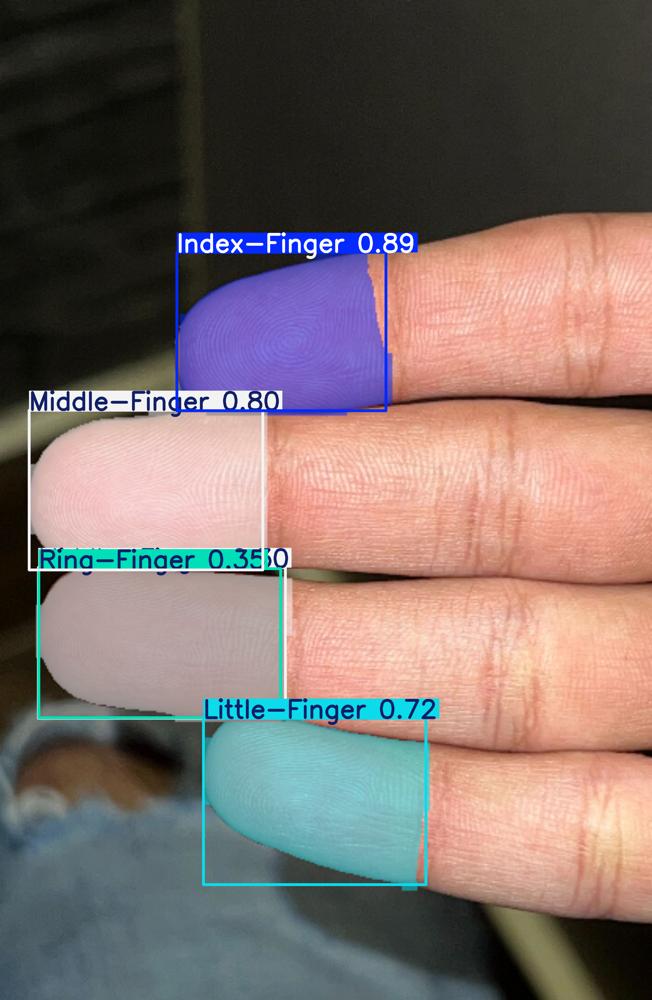

In [42]:
# Run inference on a new image

model = YOLO('/content/runs/segment/train/weights/best.pt')
results = model('/content/RIGHTHAND.jpg', save=True, imgsz=640)
results[0].show()

In [43]:
results[0].save("Right_processed.jpeg")

'Right_processed.jpeg'

In [ ]:
model = YOLO('/content/runs/segment/train/weights/best.pt')
results = model('/content/RIGHTHAND.jpg', save=True, imgsz=640)
results[0].show()
results[0].save("Left_processed.jpeg")

In [26]:
results[0]

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'Index-Finger', 1: 'Little-Finger', 2: 'Middle-Finger', 3: 'Ring-Finger', 4: 'Thumb'}
 obb: None
 orig_img: array([[[ 10,  16,  15],
         [ 11,  17,  16],
         [ 11,  17,  16],
         ...,
         [ 53,  58,  61],
         [ 54,  57,  61],
         [ 54,  57,  61]],
 
        [[ 11,  17,  16],
         [ 11,  17,  16],
         [ 11,  17,  16],
         ...,
         [ 53,  58,  61],
         [ 52,  55,  59],
         [ 52,  55,  59]],
 
        [[ 12,  18,  17],
         [ 12,  18,  17],
         [ 11,  17,  16],
         ...,
         [ 53,  58,  61],
         [ 50,  53,  57],
         [ 50,  53,  57]],
 
        ...,
 
        [[101,  88,  66],
         [100,  87,  65],
         [ 99,  86,  64],
         ...,
         [  4,   7,  11],
         [  4,   8,   9],
         [  4,   8,   9]],
 


image 1/1 /content/RIGHTHAND.jpg: 640x448 1 Index-Finger, 1 Little-Finger, 2 Middle-Fingers, 1 Ring-Finger, 24.3ms
Speed: 3.8ms preprocess, 24.3ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 448)


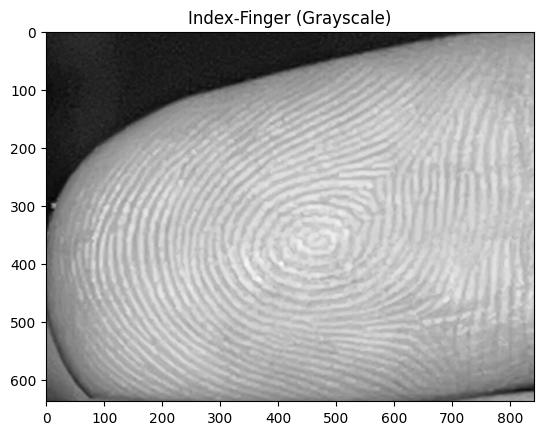

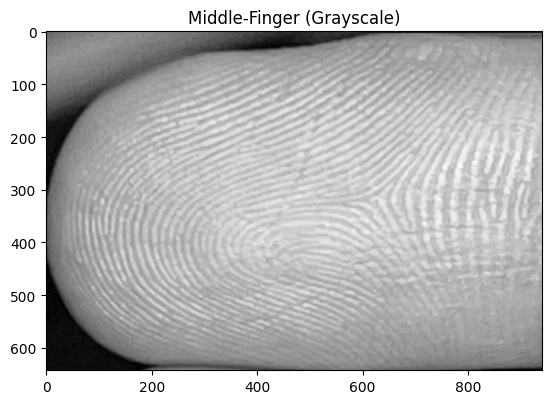

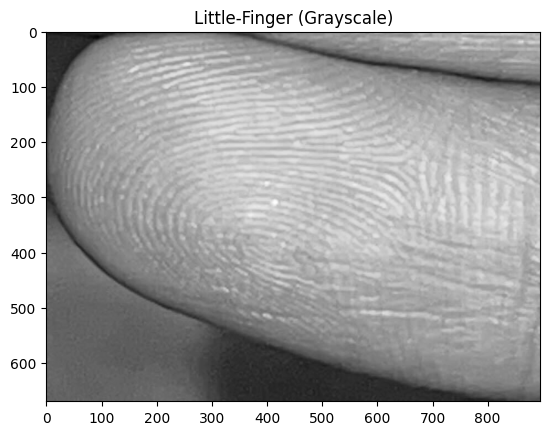

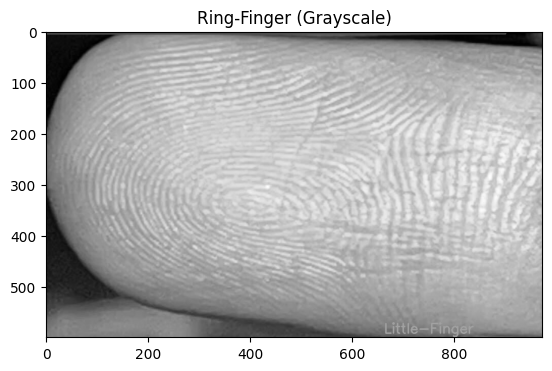

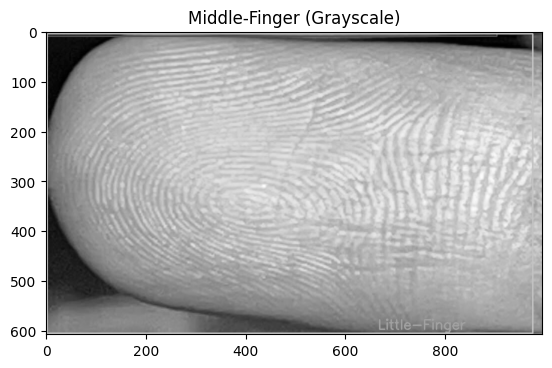

True

In [53]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load the YOLOv8 model
model = YOLO('/content/runs/segment/train/weights/best.pt')

# Perform inference on an image
results = model('/content/RIGHTHAND.jpg')  # Use original image

# Load the original image
image = "/content/RIGHTHAND.jpg"
img = cv2.imread(image)

# Class names and colors (for visualization)
class_names = ['Index-Finger', 'Little-Finger', 'Middle-Finger', 'Ring-Finger', 'Thumb']
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255)]  # Example colors

# Extract bounding boxes and class IDs
boxes = results[0].boxes.xyxy.tolist()
class_ids = results[0].boxes.cls.tolist()

# Iterate through the detections and crop objects
for i, (box, class_id) in enumerate(zip(boxes, class_ids)):
    x1, y1, x2, y2 = map(int, box)
    class_name = class_names[int(class_id)]

    # Crop the object using the bounding box coordinates
    cropped_object = img[y1:y2, x1:x2]

    # Construct the filename (e.g., Index_Right_processed.jpg)
    filename = f"{class_name}_Right_processed_{i}.jpg"  # Assuming Right hand image

    # Save the cropped object as an image with the desired filename
    cv2.imwrite(filename, cropped_object)

    # Convert the cropped object to grayscale
    gray_cropped_object = cv2.cvtColor(cropped_object, cv2.COLOR_BGR2GRAY)

    # Show the grayscale cropped object using matplotlib
    plt.figure()
    plt.imshow(gray_cropped_object, cmap='gray')
    plt.title(f"{class_name} (Grayscale)")
    plt.show()

    # (Optional) Draw bounding boxes and labels on the original image for visualization
    cv2.rectangle(img, (x1, y1), (x2, y2), colors[int(class_id)], 2)
    cv2.putText(img, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, colors[int(class_id)], 2)

# Save or display the original image with bounding boxes (optional)
cv2.imwrite('detected_objects_right.jpg', img)
# cv2.imshow('Detected Objects', img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


image 1/1 /content/LeftHand.jpg: 640x640 1 Index-Finger, 1 Little-Finger, 1 Middle-Finger, 1 Ring-Finger, 26.5ms
Speed: 2.3ms preprocess, 26.5ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)


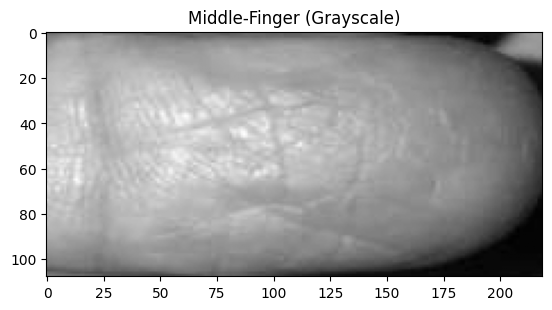

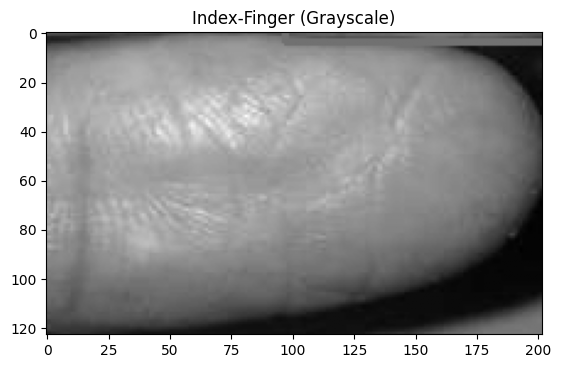

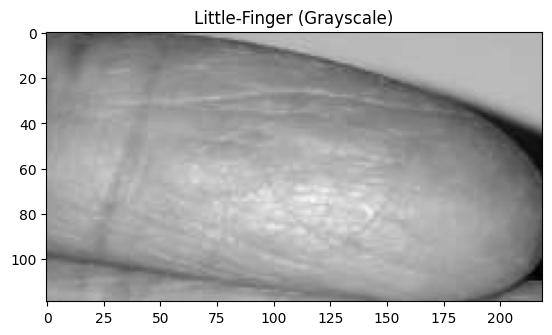

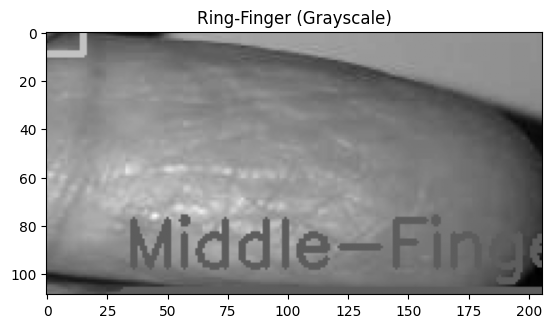

True

In [59]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load the YOLOv8 model
model = YOLO('/content/runs/segment/train/weights/best.pt')

# Perform inference on an image
results = model('/content/LeftHand.jpg')  # Use original image

# Load the original image
image = "/content/LeftHand.jpg"
img = cv2.imread(image)

# Class names and colors (for visualization)
class_names = ['Index-Finger', 'Little-Finger', 'Middle-Finger', 'Ring-Finger', 'Thumb']
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255)]  # Example colors

# Extract bounding boxes and class IDs
boxes = results[0].boxes.xyxy.tolist()
class_ids = results[0].boxes.cls.tolist()

# Iterate through the detections and crop objects
for i, (box, class_id) in enumerate(zip(boxes, class_ids)):
    x1, y1, x2, y2 = map(int, box)
    class_name = class_names[int(class_id)]

    # Crop the object using the bounding box coordinates
    cropped_object = img[y1:y2, x1:x2]

    # Construct the filename (e.g., Index_Right_processed.jpg)
    filename = f"{class_name}_left_processed_{i}.jpg"  # Assuming Right hand image

    # Save the cropped object as an image with the desired filename
    cv2.imwrite(filename, cropped_object)

    # Convert the cropped object to grayscale
    gray_cropped_object = cv2.cvtColor(cropped_object, cv2.COLOR_BGR2GRAY)

    # Show the grayscale cropped object using matplotlib
    plt.figure()
    plt.imshow(gray_cropped_object, cmap='gray')
    plt.title(f"{class_name} (Grayscale)")
    plt.show()

    # (Optional) Draw bounding boxes and labels on the original image for visualization
    cv2.rectangle(img, (x1, y1), (x2, y2), colors[int(class_id)], 2)
    cv2.putText(img, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, colors[int(class_id)], 2)

# Save or display the original image with bounding boxes (optional)
cv2.imwrite('detected_objects_left.jpg', img)
# cv2.imshow('Detected Objects', img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()


image 1/1 /content/Thumb.jpg: 640x640 1 Thumb, 26.6ms
Speed: 1.8ms preprocess, 26.6ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


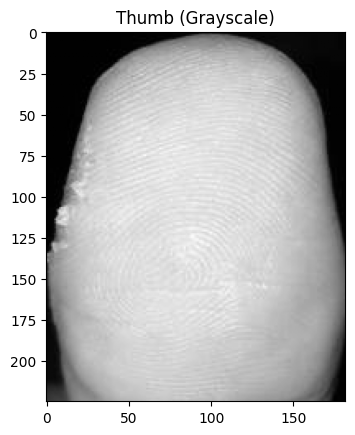

True

In [55]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load the YOLOv8 model
model = YOLO('/content/runs/segment/train/weights/best.pt')

# Perform inference on an image
results = model('/content/Thumb.jpg')  # Use original image

# Load the original image
image = "/content/Thumb.jpg"
img = cv2.imread(image)

# Class names and colors (for visualization)
class_names = ['Index-Finger', 'Little-Finger', 'Middle-Finger', 'Ring-Finger', 'Thumb']
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255)]  # Example colors

# Extract bounding boxes and class IDs
boxes = results[0].boxes.xyxy.tolist()
class_ids = results[0].boxes.cls.tolist()

# Iterate through the detections and crop objects
for i, (box, class_id) in enumerate(zip(boxes, class_ids)):
    x1, y1, x2, y2 = map(int, box)
    class_name = class_names[int(class_id)]

    # Crop the object using the bounding box coordinates
    cropped_object = img[y1:y2, x1:x2]

    # Construct the filename (e.g., Index_Right_processed.jpg)
    filename = f"{class_name}_Right_processed_{i}.jpg"  # Assuming Right hand image

    # Save the cropped object as an image with the desired filename
    cv2.imwrite(filename, cropped_object)

    # Convert the cropped object to grayscale
    gray_cropped_object = cv2.cvtColor(cropped_object, cv2.COLOR_BGR2GRAY)

    # Show the grayscale cropped object using matplotlib
    plt.figure()
    plt.imshow(gray_cropped_object, cmap='gray')
    plt.title(f"{class_name} (Grayscale)")
    plt.show()

    # (Optional) Draw bounding boxes and labels on the original image for visualization
    cv2.rectangle(img, (x1, y1), (x2, y2), colors[int(class_id)], 2)
    cv2.putText(img, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, colors[int(class_id)], 2)

# Save or display the original image with bounding boxes (optional)
cv2.imwrite('detected_objects_left.jpg', img)
# cv2.imshow('Detected Objects', img)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

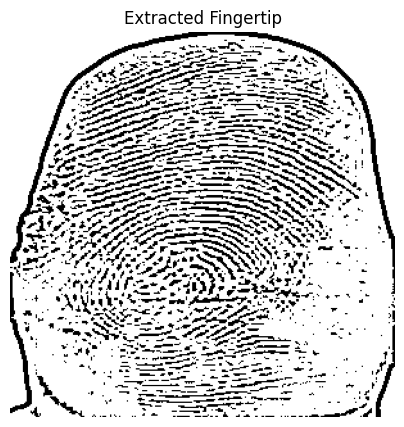

In [56]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import sys

# Load the image
img = cv.imread("/content/Thumb_Right_processed_0.jpg")

# Resize for consistency
img = cv.resize(img, (300, 300))

# Convert to HSV color space
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

# Define the lower and upper bounds for skin color in HSV
lower = np.array([0, 30, 60], dtype="uint8")  # Adjusted for better segmentation
upper = np.array([20, 255, 255], dtype="uint8")

# Threshold the image to extract skin region
mask = cv.inRange(hsv, lower, upper)

# Perform morphological transformations to remove noise
kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5, 5))
mask = cv.morphologyEx(mask, cv.MORPH_CLOSE, kernel, iterations=2)

# Find contours
contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

if len(contours) == 0:
    print("No fingertip detected.")
    sys.exit()

# Find the largest contour (assuming it's the fingertip)
fingertip_contour = max(contours, key=cv.contourArea)

# Create a binary mask for the fingertip
fingertip_mask = np.zeros_like(mask)
cv.drawContours(fingertip_mask, [fingertip_contour], -1, 255, thickness=cv.FILLED)

# Apply mask to original image
fingertip_segmented = cv.bitwise_and(img, img, mask=fingertip_mask)

# Convert to grayscale
gray_fingertip = cv.cvtColor(fingertip_segmented, cv.COLOR_BGR2GRAY)

# Apply adaptive thresholding
binary_fingertip = cv.adaptiveThreshold(
    gray_fingertip, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 11, 2
)

# Display the extracted fingertip
plt.figure(figsize=(5, 5))
plt.imshow(binary_fingertip, cmap='gray')
plt.title("Extracted Fingertip")
plt.axis("off")
plt.show()


image 1/1 /content/RIGHTHAND.jpg: 640x448 1 Index-Finger, 1 Little-Finger, 2 Middle-Fingers, 1 Ring-Finger, 24.8ms
Speed: 2.8ms preprocess, 24.8ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 448)


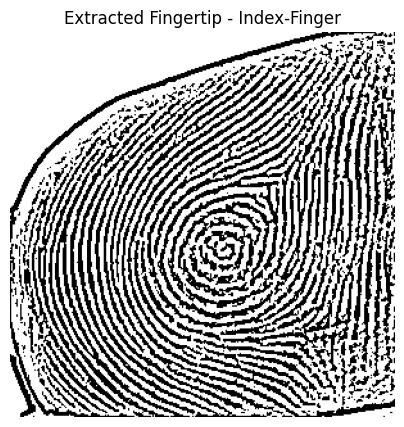

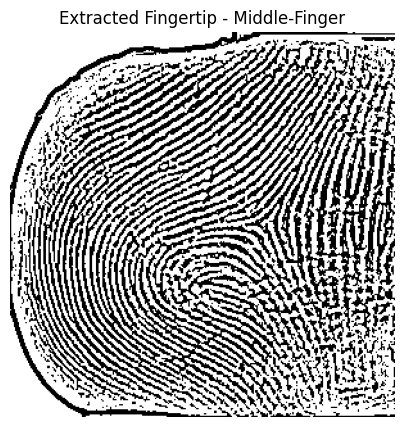

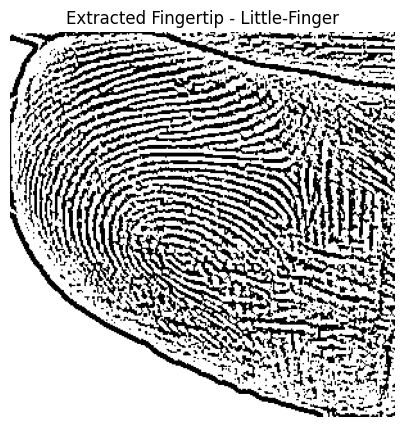

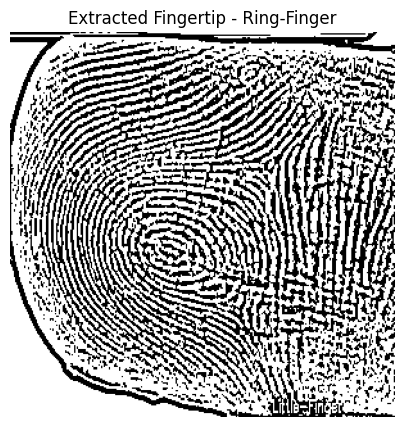

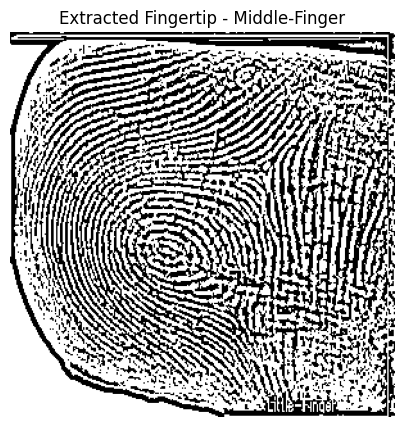

True

In [64]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load the YOLOv8 model
model = YOLO('/content/runs/segment/train/weights/best.pt')

# Perform inference on an image
results = model('/content/RIGHTHAND.jpg')  # Use original image

# Load the original image
image = "/content/RIGHTHAND.jpg"
img = cv2.imread(image)

# Class names and colors (for visualization)
class_names = ['Index-Finger', 'Little-Finger', 'Middle-Finger', 'Ring-Finger', 'Thumb']
colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (0, 255, 255)]  # Example colors

# Extract bounding boxes and class IDs
boxes = results[0].boxes.xyxy.tolist()
class_ids = results[0].boxes.cls.tolist()

# Iterate through the detections and crop objects
for i, (box, class_id) in enumerate(zip(boxes, class_ids)):
    x1, y1, x2, y2 = map(int, box)
    class_name = class_names[int(class_id)]

    # Crop the object using the bounding box coordinates
    cropped_object = img[y1:y2, x1:x2]

    # Construct the filename (e.g., Index_Right_processed.jpg)
    filename = f"Extrected_{class_name}_Left_{i}.jpg"  # Assuming Right hand image

    # Save the cropped object as an image with the desired filename
    cv2.imwrite(filename, cropped_object)

    # --- Fingertip Extraction ---
    # Resize for consistency
    cropped_object = cv2.resize(cropped_object, (300, 300))

    # Convert to HSV color space
    hsv = cv2.cvtColor(cropped_object, cv2.COLOR_BGR2HSV)

    # Define the lower and upper bounds for skin color in HSV
    lower = np.array([0, 30, 60], dtype="uint8")  # Adjusted for better segmentation
    upper = np.array([20, 255, 255], dtype="uint8")

    # Threshold the image to extract skin region
    mask = cv2.inRange(hsv, lower, upper)

    # Perform morphological transformations to remove noise
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # Find contours
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) > 0:  # Check if any contours were found
        # Find the largest contour (assuming it's the fingertip)
        fingertip_contour = max(contours, key=cv2.contourArea)

        # Create a binary mask for the fingertip
        fingertip_mask = np.zeros_like(mask)
        cv2.drawContours(fingertip_mask, [fingertip_contour], -1, 255, thickness=cv2.FILLED)

        # Apply mask to original image
        fingertip_segmented = cv2.bitwise_and(cropped_object, cropped_object, mask=fingertip_mask)

        # Convert to grayscale
        gray_fingertip = cv2.cvtColor(fingertip_segmented, cv2.COLOR_BGR2GRAY)

        # Apply adaptive thresholding
        binary_fingertip = cv2.adaptiveThreshold(
            gray_fingertip, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
        )
        # Save the extracted fingertip in grayscale
        filename_gray = f"extrected_{class_name}_Right_{i}_gray.jpg"  # New filename for grayscale image
        cv2.imwrite(filename_gray, binary_fingertip)  # Save the binary_fingertip image

        # Display the extracted fingertip (optional)
        plt.figure(figsize=(5, 5))
        plt.imshow(binary_fingertip, cmap='gray')
        plt.title(f"Extracted Fingertip - {class_name}")
        plt.axis("off")
        plt.show()

    # (Optional) Draw bounding boxes and labels on the original image for visualization
    cv2.rectangle(img, (x1, y1), (x2, y2), colors[int(class_id)], 2)
    cv2.putText(img, class_name, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, colors[int(class_id)], 2)

# Save or display the original image with bounding boxes (optional)
cv2.imwrite('detected_objects.jpg', img)